In [1]:
import os

import cv2


data = '../../../Sat2Graph/data/20cities/'
os.listdir(data)[:10]

['region_101_gt_graph.json',
 'region_82_gt_rgb.png',
 'region_146_refine_gt_graph_samplepoints.json',
 'region_176_refine_gt_graph.p',
 'region_93_graph_gt.pickle',
 'region_55_graph_gt.pickle',
 'region_175_refine_gt_graph_samplepoints.json',
 'region_25_graph_gt.pickle',
 'region_24_graph_gt.pickle',
 'region_145_gt.png']

Tile shape: (2048, 2048, 3)
Mask shape: (2048, 2048, 3)


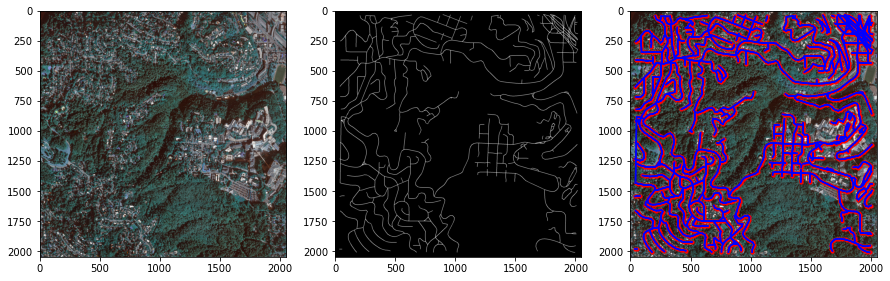

In [2]:
import pickle

import pylab as plt

def plot_graph(ax, graph, background):
    ax.imshow(background)
    for u, neighbours in graph.items():
        for v in neighbours:
            ax.plot((u[1], v[1]), (u[0], v[0]), color='b')
    for y, x in graph.keys():
        ax.scatter(x, y, color='r', s=10)
        


tile = cv2.imread(os.path.join(data, 'region_0_sat.png'))
mask = cv2.imread(os.path.join(data, 'region_0_gt.png'))
graph = pickle.load(open(os.path.join(data, 'region_0_graph_gt.pickle'), 'rb'))


fig, ax = plt.subplots(1, 3, figsize=(15, 5))

print(f'Tile shape: {tile.shape}')
print(f'Mask shape: {mask.shape}')

ax[0].imshow(tile)
ax[1].imshow(mask)
plot_graph(ax[2], graph, tile)

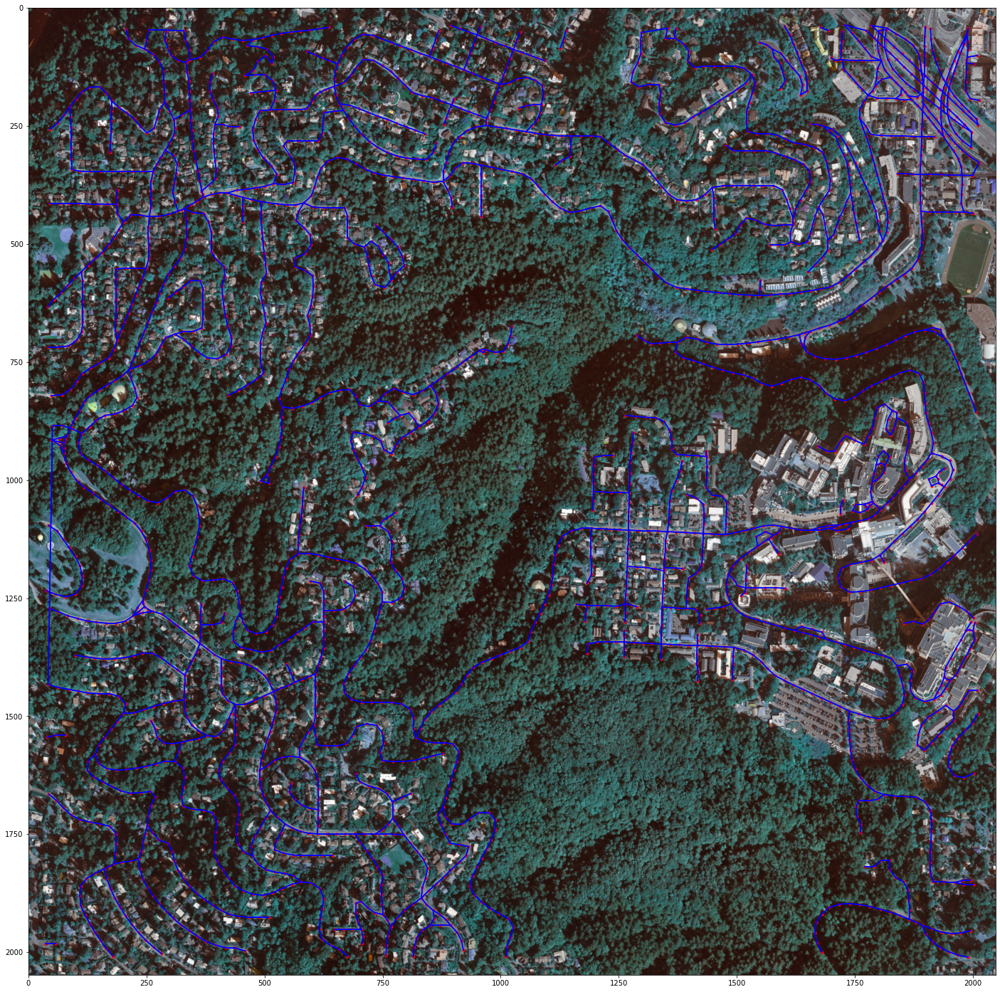

In [3]:
plt.figure(figsize=(25, 25))
plot_graph(plt, graph, tile)

Tile shape: (2000, 2000, 3)
Mask shape: (2000, 2000, 3)


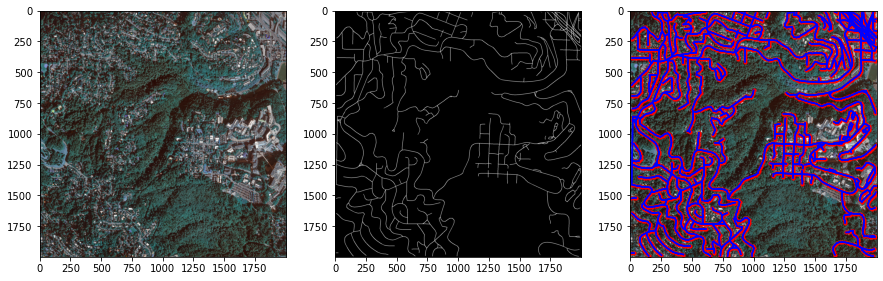

In [13]:
from collections import defaultdict

image_size = 2048
margin = 32

def crop_image(image, margin, image_size, resize=None):
    cropped = image[margin:image_size-margin, margin:image_size-margin]
    if resize is not None:
        return cv2.resize(cropped, (resize, resize))
    return cropped

cropped_tile = crop_image(tile, 32, 2048, 2000)
cropped_mask = crop_image(mask, 32, 2048, 2000)

def transform_point(point, margin, image_size, resize):
    point = (point[0] - margin, point[1] - margin)
    if resize:
        return point[0] * resize / (image_size - 2 * margin),\
               point[1] * resize / (image_size - 2 * margin)
    return point

def crop_graph(graph, margin, image_size, resize=None):
    cropped = defaultdict(set)
    for u, neighbours in graph.items():
        u = transform_point(u, margin, image_size, resize)
        for v in neighbours:
            cropped[u].add(transform_point(v, margin, image_size, resize))
    return cropped
            

fig, ax = plt.subplots(1, 3, figsize=(15, 5))

print(f'Tile shape: {cropped_tile.shape}')
print(f'Mask shape: {cropped_mask.shape}')

ax[0].imshow(cropped_tile)
ax[1].imshow(cropped_mask)
plot_graph(ax[2], crop_graph(graph, 32, 2048, 2000), cropped_tile)

In [25]:
class Point:
    def __init__(self, x: int = 0, y: int = 0):
        self.x: int = x
        self.y: int = y

    def __sub__(self, other: 'Point') -> 'Point':
        assert isinstance(other, Point)
        return Point(self.x - other.x, self.y - other.y)

    def clamped(self, rect: 'Rect'):
        x = max(rect.top_left.x, min(rect.bottom_right.x - 1, self.x))
        y = max(rect.top_left.y, min(rect.bottom_right.y - 1, self.y))
        return Point(x, y)
    
    def to_tuple(self):
        return self.x, self.y
    
    @staticmethod
    def from_tuple(t):
        return Point(x=t[0], y=t[1])


class Rect:
    def __init__(self, top_left: Point, bottom_right: Point):
        self.top_left: Point = top_left
        self.bottom_right: Point = bottom_right

    def contains(self, point: Point) -> bool:
        return self.top_left.x <= point.x <= self.bottom_right.x \
               and self.top_left.y <= point.y <= self.bottom_right.y

    @staticmethod
    def from_coord(x1, y1, x2, y2):
        return Rect(Point(x1, y1), Point(x2, y2))

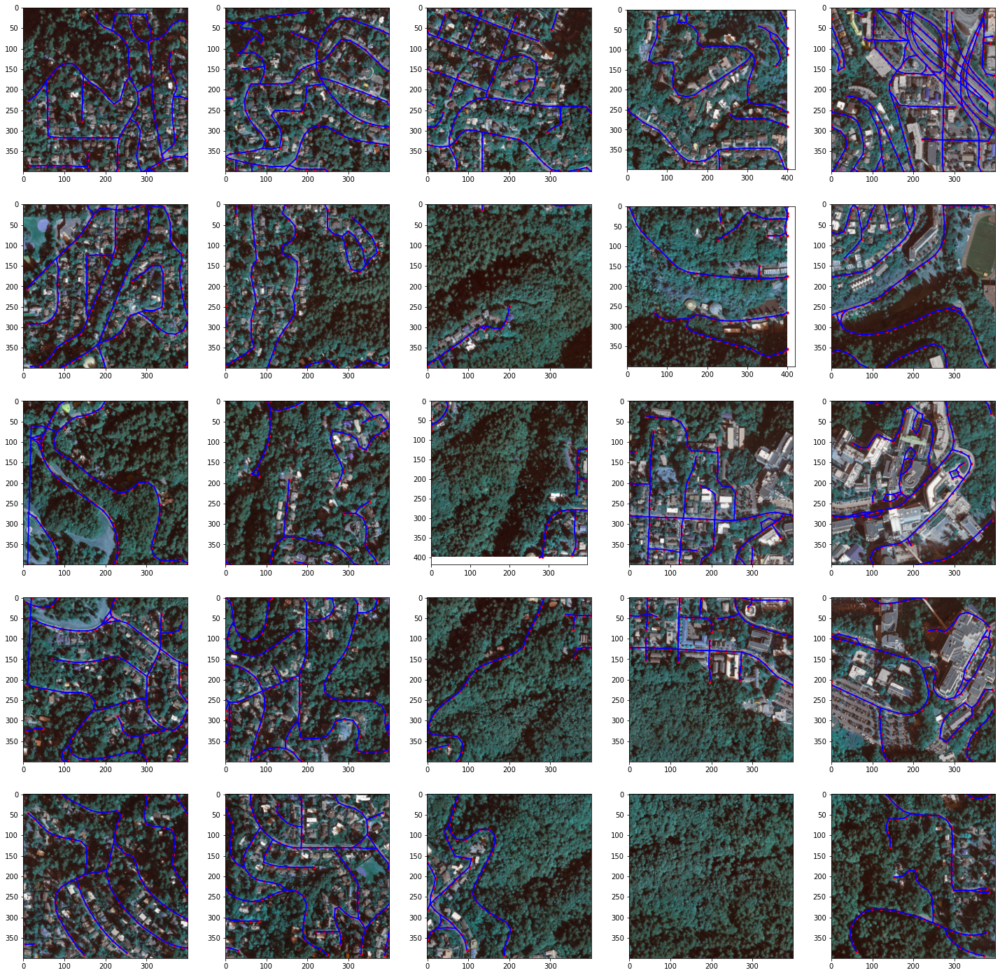

In [26]:
def graph_in_rect(graph, rect: Rect):
    result = defaultdict(set)
    for u in filter(lambda node: rect.contains(Point.from_tuple(node)), graph.keys()):
        u_shifted = Point.from_tuple(u) - rect.top_left
        for v in graph[u]:
            v_shifted = Point.from_tuple(v).clamped(rect) - rect.top_left
            result[u_shifted.to_tuple()].add(v_shifted.to_tuple())
            result[v_shifted.to_tuple()].add(u_shifted.to_tuple())
    return result


def split_image(image, graph):
    n, m, *_ = image.shape
    dx, dy = n // 5, m // 5
    result = []
    for i in range(5):
        for j in range(5):
            x1, x2 = dx * i, dx * (i + 1)
            y1, y2 = dy * j, dy * (j + 1)
            image_k = image[x1:x2, y1:y2]
            graph_k = graph_in_rect(graph, Rect.from_coord(x1, y1, x2, y2))
            result.append((image_k, graph_k))
            
    return result


splitted = split_image(cropped_tile, crop_graph(graph, 32, 2048, 2000))

fig, ax = plt.subplots(5, 5, figsize=(25, 25))
for i in range(5):
    for j in range(5):
        idx = 5 * i + j
        plot_graph(ax[i, j], splitted[idx][1], splitted[idx][0])

In [30]:
def split_datapoint(tile, mask, graph):
    n, m, *_ = tile.shape
    dx, dy = n // 5, m // 5
    result = []
    for i in range(5):
        for j in range(5):
            x1, x2 = dx * i, dx * (i + 1)
            y1, y2 = dy * j, dy * (j + 1)
            tile_k = tile[x1:x2, y1:y2]
            mask_k = mask[x1:x2, y1:y2]
            graph_k = graph_in_rect(graph, Rect.from_coord(x1, y1, x2, y2))
            result.append((tile_k, mask_k, graph_k))
            
    return result

def rescale_point(point, old_size, new_size):
    return int(point[0] * new_size / old_size), int(point[1] * new_size / old_size)


def rescale_graph(graph, old_size, new_size):
    rescaled = defaultdict(set)
    for u, neighbours in graph.items():
        u = rescale_point(u, old_size, new_size)
        for v in neighbours:
            v = rescale_point(v, old_size, new_size)
            rescaled[u].add(v)
    return rescaled
    
    
folder = '../data/20cities/'
records = []
for i in range(180):
    tile = cv2.imread(os.path.join(data, f'region_{i}_sat.png'))
    mask = cv2.imread(os.path.join(data, f'region_{i}_gt.png'))
    graph = pickle.load(open(os.path.join(data, f'region_{i}_graph_gt.pickle'), 'rb'))
    
    cropped_tile = crop_image(tile, 32, 2048, 2000)
    cropped_mask = crop_image(mask, 32, 2048, 2000)
    cropped_graph = crop_graph(graph, 32, 2048, 2000)
    
    splitted = split_datapoint(cropped_tile, cropped_mask, cropped_graph)
    for j, (t, m, g) in enumerate(splitted):
        record = {
            'tile': os.path.abspath(os.path.join(folder, f'20cities_{25 * i + j}_tile.png')),
            'mask': os.path.abspath(os.path.join(folder, f'20cities_{25 * i + j}_mask.png')),
            'graph': os.path.abspath(os.path.join(folder, f'20cities_{25 * i + j}_graph.p'))
        }
        
        cv2.imwrite(record['tile'], cv2.resize(t, (512, 512)))
        cv2.imwrite(record['mask'], cv2.resize(m, (512, 512)))
        pickle.dump(rescale_graph(g, 400, 512), open(record['graph'], 'wb'))
        
        records.append(record)
        
    print(f'Processed {i + 1} tiles')

Processed 1 tiles
Processed 2 tiles
Processed 3 tiles
Processed 4 tiles
Processed 5 tiles
Processed 6 tiles
Processed 7 tiles
Processed 8 tiles
Processed 9 tiles
Processed 10 tiles
Processed 11 tiles
Processed 12 tiles
Processed 13 tiles
Processed 14 tiles
Processed 15 tiles
Processed 16 tiles
Processed 17 tiles
Processed 18 tiles
Processed 19 tiles
Processed 20 tiles
Processed 21 tiles
Processed 22 tiles
Processed 23 tiles
Processed 24 tiles
Processed 25 tiles
Processed 26 tiles
Processed 27 tiles
Processed 28 tiles
Processed 29 tiles
Processed 30 tiles
Processed 31 tiles
Processed 32 tiles
Processed 33 tiles
Processed 34 tiles
Processed 35 tiles
Processed 36 tiles
Processed 37 tiles
Processed 38 tiles
Processed 39 tiles
Processed 40 tiles
Processed 41 tiles
Processed 42 tiles
Processed 43 tiles
Processed 44 tiles
Processed 45 tiles
Processed 46 tiles
Processed 47 tiles
Processed 48 tiles
Processed 49 tiles
Processed 50 tiles
Processed 51 tiles
Processed 52 tiles
Processed 53 tiles
Pr

In [29]:
import pandas as pd

pd.DataFrame(records).to_csv(os.path.join('../data/', '20cities_dataset.csv'))